In [ ]:
or various reasons, many real world datasets contain missing values, often encoded as blanks, NaNs or other placeholders. 
Such datasets however are incompatible with scikit-learn estimators which assume that all values in an array are numerical, and that all have and hold meaning.
A basic strategy to use incomplete datasets is to discard entire rows and/or columns containing missing values. 
However, this comes at the price of losing data which may be valuable (even though incomplete). 
A better strategy is to impute the missing values, i.e., to infer them from the known part of the data

In [ ]:
They are:

Dropping observations that have missing values
Imputing the missing values based on other observations

Dropping missing values is sub-optimal because when we drop observations, we drop information.

The fact that the value was missing may be informative in itself.We need to understand business deeper to uncover why this information is missing in real world problems.In real time problems we need to make predictions even if some of the features are missing !!!.

Imputing missing values is sub-optimal because the value was originally missing but you filled it in, which always leads to a loss in information, no matter how sophisticated our imputation method is.

"Missingness" is almost always informative in itself, and we should tell our algorithm if a value was missing.Even if we build a model to impute our values, we are not adding any real information. You’re just reinforcing the patterns already provided by other features.

Basically, there are three categories of missing data. We assume that each record or observation can be divided into an "observable component" and an "unobservable component". We also assume that the records are independent and identically distributed.

MCAR (Missing Completely At Random) where the pattern of missinginess is statistically independent of the data record. Example: you have a data set on a piece of paper and you spill coffee on the paper destroying part of the data.

MAR (Missing At Random) where the probability distribution of the pattern of missingness is functionally dependent upon the observable component in the record. MCAR is a special case of MAR. Example: you have a question on a survey asking if the survey participant is a drug addict and another question which asks if the survey participant has less than one alcoholic drink per year. Assume the answer to the alcoholic drink question is always observable, then the probability that someone fails to answer the drug addict question is most likely functionally dependent upon their answer to the alcoholic drink question.

MNAR (Missing Not at Random) which is defined as the case which is NOT MAR. In the MNAR case, you can have situations where both the drug addict and alcoholic drink questions are absent in the same record. Another example, is a case where the question is: "What is your gender?" Suppose that females are less likely to answer this question than males. This is another example of an MNAR question because the probability that the answer is observable is conditionally dependent upon the unobservable component of the data record.

In [ ]:
Strategies :

We should never insert mean, mode, median, max, min or anything else for missing values. That is, avoid deterministic imputation even though it is widely used and available in most software packages. It underestimates and distorts the statistical regularities (e.g., underestimates variance is one example) present in the data sample.

If the data records are MCAR Then you can delete records with missing data.

If the data records are MCAR, then sometimes you can stochastically impute the missing values rather than deterministically impute them. So this means that if you specify the marginal probability distribution of a missing value as Gaussian with some known mean and some known variance then you can sample from that distribution to impute values into the data set. We need to be careful and do some additional research and analysis on data ,understand the business completely and take a judicious decision.

If the data is MAR then an algorithm such as Expectation Maximization can be used to handle the missing observations.

If the data is MNAR we can include binary indicators in the data record which explicitly identify when a variable is not observable. The challenge with this approach is that a highly nonlinear model needs to be designed to properly integrate this information in an appropriate manner. This might work in a machine learning algorithm where the binary indicators "disconnect" the influence of predictors which are not observable. Consequently, the MNAR theory (i.e., the theory of the joint distribution of the complete data record and missing data pattern) is instantiated in the learning machine's probabilistic model of its statistical environment

In [ ]:
Missing numeric data
For missing numeric data, we should flag and fill the values.

Flag the observation with an indicator variable of missingness.
Secondly fill the original missing value with 0 just to meet the technical requirement of no missing values.
By using this technique of flagging and filling, we are essentially allowing the algorithm to estimate the optimal constant for missingness, instead of just filling it in with the mean.

Missing categorical data
The best way to handle missing data for categorical features is to simply label them as ’Missing’!

We are essentially adding a new class for the feature.
This tells the algorithm that the value was missing.
This also gets around the technical requirement for no missing values.

In [ ]:
Univariate vs. Multivariate Imputation
One type of imputation algorithm is univariate, which imputes values in the i-th feature dimension using only non-missing values in that feature dimension (e.g. impute.SimpleImputer).
multivariate imputation algorithms use the entire set of available feature dimensions to estimate the missing values (e.g. impute.IterativeImputer).

**Univariate feature imputation**

In [ ]:
The SimpleImputer class provides basic strategies for imputing missing values. 
Missing values can be imputed with a provided constant value, or using the statistics (mean, median or most frequent) of each column in which the missing values are located.
This class also allows for different missing values encodings.

In [ ]:
#supports categorical data represented as string values or pandas categoricals when using the 'most_frequent' or 'constant' strategy
import pandas as pd
import numpy as np  
from sklearn.impute import SimpleImputer
df = pd.DataFrame([["a", "x"],
                   [np.nan, "y"],
                   ["a", np.nan],
                   ["b", "y"]], dtype="category")

imp = SimpleImputer(strategy="most_frequent")
print(imp.fit_transform(df))

[['a' 'x']
 ['a' 'y']
 ['a' 'y']
 ['b' 'y']]


In [ ]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
print(imp.fit_transform([[1, 2], [np.nan, 3], [7, 6]]))

[[1. 2.]
 [4. 3.]
 [7. 6.]]


**Multivariate feature imputation**

In [ ]:
 IterativeImputer class, which models each feature with missing values as a function of other features, and uses that estimate for imputation. 

In [ ]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit([[1, 2], [3, 6], [4, 8], [np.nan, 3], [7, np.nan]])
IterativeImputer(random_state=0)
X_test = [[np.nan, 2], [6, np.nan], [np.nan, 6]]
# the model learns that the second feature is double the first
print(np.round(imp.transform(X_test)))

[[ 1.  2.]
 [ 6. 12.]
 [ 3.  6.]]


**Nearest neighbors imputation**

In [ ]:
import numpy as np
from sklearn.impute import KNNImputer
nan = np.nan
X = [[1, 2, nan], [3, 4, 3], [nan, 6, 5], [8, 8, 7]]
imputer = KNNImputer(n_neighbors=2, weights="uniform")
imputer.fit_transform(X)

array([[1. , 2. , 4. ],
       [3. , 4. , 3. ],
       [5.5, 6. , 5. ],
       [8. , 8. , 7. ]])

**Marking imputed values**

In [ ]:
#The MissingIndicator transformer is useful to transform a dataset into corresponding binary matrix indicating the presence of missing values in the dataset.
from sklearn.impute import MissingIndicator
X = np.array([[-1, -1, 1, 3],
              [4, -1, 0, -1],
              [8, -1, 1, 0]])
indicator = MissingIndicator(missing_values=-1)
mask_missing_values_only = indicator.fit_transform(X)
mask_missing_values_only

array([[ True,  True, False],
       [False,  True,  True],
       [False,  True, False]])

In [ ]:
#The features parameter is used to choose the features for which the mask is constructed. 
#By default, it is 'missing-only' which returns the imputer mask of the features containing missing values at fit time:
indicator.features_

array([0, 1, 3])

In [ ]:
#The features parameter can be set to 'all' to return all features whether or not they contain missing values
indicator = MissingIndicator(missing_values=-1, features="all")
mask_all = indicator.fit_transform(X)
print(mask_all)
print(indicator.features_)

[[ True  True False False]
 [False  True False  True]
 [False  True False False]]
[0 1 2 3]


**MissingIndicator in a Pipeline**

In [ ]:
#When using the MissingIndicator in a Pipeline, be sure to use the FeatureUnion or ColumnTransformer to add the indicator features to the regular features.
from sklearn.datasets import load_iris
from sklearn.impute import SimpleImputer, MissingIndicator
from sklearn.model_selection import train_test_split
from sklearn.pipeline import FeatureUnion, make_pipeline
from sklearn.tree import DecisionTreeClassifier
X, y = load_iris(return_X_y=True)
mask = np.random.randint(0, 2, size=X.shape).astype(np.bool)
X[mask] = np.nan
X_train, X_test, y_train, _ = train_test_split(X, y, test_size=100,random_state=0)

In [ ]:
#Now we create a FeatureUnion. All features will be imputed using SimpleImputer, in order to enable classifiers to work with this data.
# Additionally, it adds the the indicator variables from MissingIndicator.
transformer = FeatureUnion(
transformer_list=[ ('features', SimpleImputer(strategy='mean')), ('indicators', MissingIndicator())])
transformer = transformer.fit(X_train, y_train)
results = transformer.transform(X_test)
results.shape

(100, 8)

In [ ]:
clf = make_pipeline(transformer, DecisionTreeClassifier())
clf = clf.fit(X_train, y_train)
results = clf.predict(X_test)
results.shape

(100,)

**Part-1**

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving train.csv to train.csv


In [ ]:
train=pd.read_csv('train.csv')
train.head(2)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving test.csv to test.csv


In [ ]:
test=pd.read_csv('test.csv')
test.head(2)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S


In [ ]:
# Concatenate train & test
train_objs_num = len(train)
y = train['Survived']
dataset = pd.concat(objs=[train.drop(columns=['Survived']), test], axis=0)

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1309 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Pclass       1309 non-null   int64  
 2   Name         1309 non-null   object 
 3   Sex          1309 non-null   object 
 4   Age          1046 non-null   float64
 5   SibSp        1309 non-null   int64  
 6   Parch        1309 non-null   int64  
 7   Ticket       1309 non-null   object 
 8   Fare         1308 non-null   float64
 9   Cabin        295 non-null    object 
 10  Embarked     1307 non-null   object 
dtypes: float64(2), int64(4), object(5)
memory usage: 122.7+ KB


,Total,Percent
Cabin,1014,0.774637
Age,263,0.200917
Embarked,2,0.001528
Fare,1,0.000764
Ticket,0,0.000000


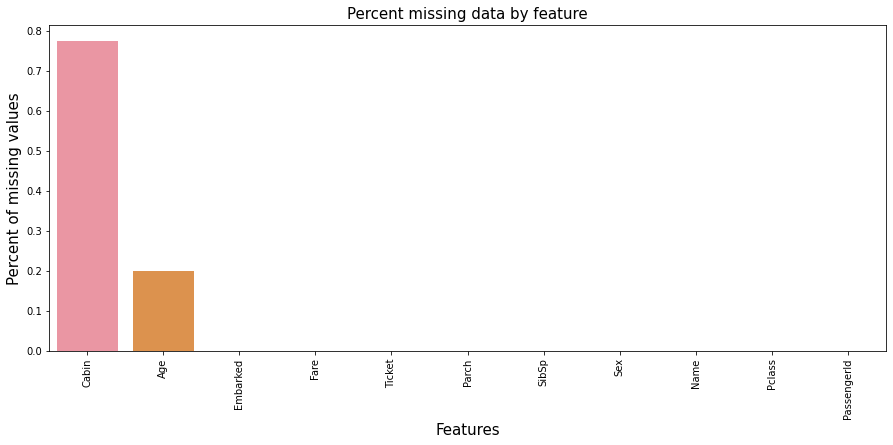

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
total = dataset.isnull().sum().sort_values(ascending=False)
percent = (dataset.isnull().sum()/dataset.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
f, ax = plt.subplots(figsize=(15, 6))
plt.xticks(rotation='90')
sns.barplot(x=missing_data.index, y=missing_data['Percent'])
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)
missing_data.head()

In [ ]:
dataset.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


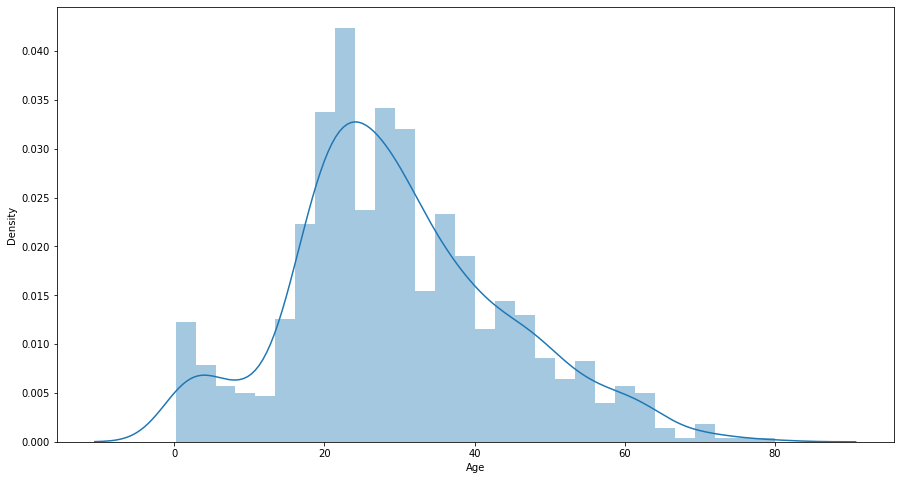

In [ ]:
# Plot histogram using seaborn
plt.figure(figsize=(15,8))
sns.distplot(dataset.Age, bins =30)

**Missing values Treatment Techniques**

**1.Deleting Data**

In [ ]:
This method is the most commonly used to handle the null values. Here, we either delete a particular record if it has a null value for a particular feature ,and a particular feature if it has more than 70-75% of missing values. This method is advised only when there are enough samples in the data set.

Note : One has to make sure that after we have deleted the data, there is no addition of bias. Removing the data will lead to loss of information which will not give the expected results while predicting the output.

Imagine we drop one whole observation just because one of the features had a missing value, even if the rest of the features are perfectly filled and informative

In [ ]:
df = dataset
# Will drop all features with missing values 
df.dropna(inplace = True)
df.isnull().sum()

PassengerId    0
Pclass         0
Name           0
Sex            0
Age            0
SibSp          0
Parch          0
Ticket         0
Fare           0
Cabin          0
Embarked       0
dtype: int64

In [ ]:
#You can also select to drop the rows only if all of the values in the row are missing.
df1 = dataset
# Will drop the rows only if all of the values in the row are missing
df1.dropna(how = 'all',inplace = True)

In [ ]:
#Sometimes, we may just want to drop a feature that has some missing values.
df = dataset
# Will drop a feature that has some missing values.
df.dropna(axis = 1,inplace = True)

In [ ]:
#Suppose we want to keep only the rows with at least 4 non-na values
df.dropna(thresh = 4,inplace = True)

In [ ]:
#dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
DataFrame.isna: Indicate missing values.
DataFrame.notna : Indicate existing (non-missing) values.
DataFrame.fillna : Replace missing values.
Series.dropna : Drop missing values.
Index.dropna : Drop missing indices.

In [ ]:
df = pd.DataFrame({"name": ['Alfred', 'Batman', 'Catwoman'],
                   "toy": [np.nan, 'Batmobile', 'Bullwhip'],
                   "born": [pd.NaT, pd.Timestamp("1940-04-25"),
                            pd.NaT]})
print(df)
# Drop the rows where at least one element is missing.
print(df.dropna())
#Drop the columns where at least one element is missing.
print(df.dropna(axis='columns'))
#Drop the rows where all elements are missing.
print(df.dropna(how='all'))
#Keep only the rows with at least 2 non-NA values.
print(df.dropna(thresh=2))
#Define in which columns to look for missing values.
print(df.dropna(subset=['name', 'born']))
#Keep the DataFrame with valid entries in the same variable.
print(df.dropna(inplace=True))
print(df)

       name        toy       born
0    Alfred        NaN        NaT
1    Batman  Batmobile 1940-04-25
2  Catwoman   Bullwhip        NaT
     name        toy       born
1  Batman  Batmobile 1940-04-25
       name
0    Alfred
1    Batman
2  Catwoman
       name        toy       born
0    Alfred        NaN        NaT
1    Batman  Batmobile 1940-04-25
2  Catwoman   Bullwhip        NaT
       name        toy       born
1    Batman  Batmobile 1940-04-25
2  Catwoman   Bullwhip        NaT
     name        toy       born
1  Batman  Batmobile 1940-04-25
None
     name        toy       born
1  Batman  Batmobile 1940-04-25


In [ ]:
In summary it is always better to keep data than to delete them.

The only case that it may worth deleting a variable is when its missing values are more than 60% of the observations but only if that variable is insignificant.Taking this into consideration, imputation is always a preferred choice over deleting variables.

Pros:

Complete removal of data with missing values results in robust and highly accurate model
Deleting a particular row or a column with no specific information is better, since it does not have a high weightage
Cons:

Loss of information and data
Works poorly if the percentage of missing values is high (say 30%), compared to the whole dataset

**2. Back-fill or Forward-fill**

In [ ]:
#Back-fill or forward-fill to propagate next or previous values respectively.
df = dataset
#for back fill
df.fillna(method='bfill',inplace=True)
#for forward-fill
df.fillna(method='ffill',inplace=True)
#NaN value will remain even after forward filling or back filling if a next or previous value isn’t available or it is also a NaN value.

**3. Replace with constant value**

In [ ]:
Replace with some constant value outside fixed value range-999,-1 etc This method is useful as it gives the possibility to group missing values as a separate category represented by a constant value. It is a preferred option when it doesn’t make sense to try and predict a missing value. The downside is that performance of linear models can suffer.Use a global constant to fill in for missing values. For example, in the titanic dataset filling in the missing value of the Embarked feature with the most common Port of Embarkation might not really makes sense as opposed to using something like “N/A”.

In [ ]:
# Replace with a constant value
# dataframe.Column_Name.fillna(-99,inplace=True)

**Replacing With Mean/Median/Mode**

In [ ]:
This strategy can be applied on a feature which has numeric data like the age of a person or the ticket fare. We can calculate the mean, median or mode of the feature and replace it with the missing values. This is an approximation which can add variance to the data set. But the loss of the data can be negated by this method which yields better results compared to removal of rows and columns. Replacing with the above three approximations are a statistical approach of handling the missing values. This method is also called as leaking the data while training. Another way is to approximate it with the deviation of neighbouring values. This works better if the data is linear.

In [ ]:
#MEAN: Suitable for continuous data without outliers
df3 = train
df3['Age'].isnull().sum()

177

In [ ]:
df3['Age'].mean()

29.69911764705882

In [ ]:
df3['Age'].replace(np.NaN,df3['Age'].mean()).head(15)

0     22.000000
1     38.000000
2     26.000000
3     35.000000
4     35.000000
5     29.699118
6     54.000000
7      2.000000
8     27.000000
9     14.000000
10     4.000000
11    58.000000
12    20.000000
13    39.000000
14    14.000000
Name: Age, dtype: float64

In [ ]:
#MEDIAN : Suitable for continuous data with outliers
df4 = train
df4['Age'].fillna(df4['Age'].median(),inplace=True)
df4.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
#Mode: For categorical feature we can select to fill in the missing values with the most common value(mode) as illustrated below.
data_cat=train
data_cat['Embarked'].fillna(data_cat['Embarked'].mode()[0], inplace=True)
data_cat.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
Pros:

This is a better approach when the data size is small
It can prevent data loss which results in removal of the rows and columns
Cons:

Imputing the approximations add variance and bias
Works poorly compared to other multiple-imputations method

Mean, Median and Mode imputation diminishes any correlations involving the variable(s) that are imputed. This is because we assume that there is no relationship between the imputed variable and any other measured variables. Thus, those imputations have some attractive properties for univariate analysis but become problematic for multivariate analysis.

**Assigning An Unique Category**

In [ ]:
A categorical feature will have a definite number of possibilities, such as gender, for example. Since they have a definite number of classes, we can assign another class for the missing values. Here, the features Cabin and Embarked have missing values which can be replaced with a new category, say, U for ‘unknown’. This strategy will add more information into the dataset which will result in the change of variance. Since they are categorical, we need to find one hot encoding to convert it to a numeric form for the algorithm to understand it.

In [ ]:
data_unique = train
data_unique['Cabin'].head(10)

In [ ]:
data_unique['Cabin'].fillna('U').head(10)

In [ ]:
Pros:

Less possibilities with one extra category, resulting in low variance after one hot encoding — since it is categorical
Negates the loss of data by adding an unique category
Cons:

Adds less variance
Adds another feature to the model while encoding, which may result in poor performance

In [ ]:
#How to handle missing categorical features?
from google.colab import files
uploaded = files.upload()

Saving data.csv to data.csv


In [ ]:
df=pd.read_csv('data.csv')
df.head(2)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,...,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,...,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,...,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [ ]:
categorical_features = [feature for feature in df.columns if len(df[feature].unique())<25]
categorical_features

['MSSubClass',
 'MSZoning',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageCars',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 '3SsnPorch',
 'PoolArea',
 'PoolQC',
 'Fence',
 'MiscFeature',
 'MiscVal',
 'MoSold',
 'YrSold',
 'SaleType',
 'SaleCondition']

In [ ]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is MSSubClass and number of categories are 15
The feature is MSZoning and number of categories are 5
The feature is Street and number of categories are 2
The feature is Alley and number of categories are 3
The feature is LotShape and number of categories are 4
The feature is LandContour and number of categories are 4
The feature is Utilities and number of categories are 2
The feature is LotConfig and number of categories are 5
The feature is LandSlope and number of categories are 3
The feature is Condition1 and number of categories are 9
The feature is Condition2 and number of categories are 8
The feature is BldgType and number of categories are 5
The feature is HouseStyle and number of categories are 8
The feature is OverallQual and number of categories are 10
The feature is OverallCond and number of categories are 9
The feature is RoofStyle and number of categories are 6
The feature is RoofMatl and number of categories are 8
The feature is Exterior1st and number of catego

In [ ]:
#Identifying missing categorical values
df[categorical_features].isnull().sum()

MSSubClass          0
MSZoning            0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinType2       38
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
LowQualFinSF        0
BsmtFullBath        0
BsmtHalfBath        0
FullBath            0
HalfBath            0
BedroomAbvGr        0
KitchenAbvGr        0
KitchenQual         0
TotRmsAbvGrd        0
Functional          0
Fireplaces          0
FireplaceQu       690
GarageType         81
GarageFini

In [ ]:
#considering features only with more than 100 missing records
missing_cf= ['Alley','MiscFeature','Fence','PoolQC','FireplaceQu']

In [ ]:
df1 = df[missing_cf]
df1.head(10)

,Alley,MiscFeature,Fence,PoolQC,FireplaceQu
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,TA
2,NaN,NaN,NaN,NaN,TA
3,NaN,NaN,NaN,NaN,Gd
4,NaN,NaN,NaN,NaN,TA
5,NaN,Shed,MnPrv,NaN,NaN
6,NaN,NaN,NaN,NaN,Gd
7,NaN,Shed,NaN,NaN,TA
8,NaN,NaN,NaN,NaN,TA
9,NaN,NaN,NaN,NaN,TA


In [ ]:
#Frequent Categorical Imputation[Mode Imputation]
#Replacing NaN values with the most frequent occurred category in variable/column. First find which category occurs the most and replace all the NaNs with that category.
for feature in missing_cf:
    print(df1[feature].mode())

0    Grvl
dtype: object
0    Shed
dtype: object
0    MnPrv
dtype: object
0    Gd
dtype: object
0    Gd
dtype: object


In [ ]:
for feature in missing_cf:
    df1[feature] = df1[feature].fillna(df1[feature].mode()[0])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df1.head(10)

,Alley,MiscFeature,Fence,PoolQC,FireplaceQu
0,Grvl,Shed,MnPrv,Gd,Gd
1,Grvl,Shed,MnPrv,Gd,TA
2,Grvl,Shed,MnPrv,Gd,TA
3,Grvl,Shed,MnPrv,Gd,Gd
4,Grvl,Shed,MnPrv,Gd,TA
5,Grvl,Shed,MnPrv,Gd,Gd
6,Grvl,Shed,MnPrv,Gd,Gd
7,Grvl,Shed,MnPrv,Gd,TA
8,Grvl,Shed,MnPrv,Gd,TA
9,Grvl,Shed,MnPrv,Gd,TA


**Create a new cateogory/label for NaN values**

In [ ]:
#Create a new category for NAN values i.e random category i.e. replace NaN value with a name/label.
df2 = df[missing_cf]
df2.head(10)

,Alley,MiscFeature,Fence,PoolQC,FireplaceQu
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,TA
2,NaN,NaN,NaN,NaN,TA
3,NaN,NaN,NaN,NaN,Gd
4,NaN,NaN,NaN,NaN,TA
5,NaN,Shed,MnPrv,NaN,NaN
6,NaN,NaN,NaN,NaN,Gd
7,NaN,Shed,NaN,NaN,TA
8,NaN,NaN,NaN,NaN,TA
9,NaN,NaN,NaN,NaN,TA


In [ ]:
df2['FireplaceQu'] = np.where(df2['FireplaceQu'].isnull(), "Data Missing",df2['FireplaceQu'] )
df2.head(10)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Alley,MiscFeature,Fence,PoolQC,FireplaceQu
0,NaN,NaN,NaN,NaN,Data Missing
1,NaN,NaN,NaN,NaN,TA
2,NaN,NaN,NaN,NaN,TA
3,NaN,NaN,NaN,NaN,Gd
4,NaN,NaN,NaN,NaN,TA
5,NaN,Shed,MnPrv,NaN,Data Missing
6,NaN,NaN,NaN,NaN,Gd
7,NaN,Shed,NaN,NaN,TA
8,NaN,NaN,NaN,NaN,TA
9,NaN,NaN,NaN,NaN,TA


In [ ]:
Advantage:

Simple and easy to implement for categorical variables/columns and preserves the variance.
Disadvantages:

May create random data if the missing category is more.
Doesn’t give good results when missing data is a high percentage of the data.

**KNN Imputer**

In [ ]:
This imputer utilizes the k-Nearest Neighbors method to replace the missing values in the datasets with the mean value from the parameter ‘n_neighbors’ nearest neighbors found in the training set.
By default, it uses a Euclidean distance metric to impute the missing values.

In [ ]:
df3 = df[missing_cf]
df3.head(10)

,Alley,MiscFeature,Fence,PoolQC,FireplaceQu
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,TA
2,NaN,NaN,NaN,NaN,TA
3,NaN,NaN,NaN,NaN,Gd
4,NaN,NaN,NaN,NaN,TA
5,NaN,Shed,MnPrv,NaN,NaN
6,NaN,NaN,NaN,NaN,Gd
7,NaN,Shed,NaN,NaN,TA
8,NaN,NaN,NaN,NaN,TA
9,NaN,NaN,NaN,NaN,TA


In [ ]:
For this imputation, we first need to perform encoding as does not recognize text data values and will throw error if we do not change these values to numerical values. I am doing mapping, you can also go with LabelEncoding or OneHotEncoding.

In [ ]:
df3['FireplaceQu'].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [ ]:
#Lets take only one features for this one.

df3 = df3[['FireplaceQu']]
df3['FireplaceQu'] = df3['FireplaceQu'].map({'TA':1, 'Gd':2, 'Fa':3, 'Ex':4, 'Po':5})
df3.head()

,FireplaceQu
0,NaN
1,1.0
2,1.0
3,2.0
4,1.0


In [ ]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=10)
df3 = pd.DataFrame(imputer.fit_transform(df3),columns = df3.columns)

In [ ]:
df3.tail(20)

,FireplaceQu
1440,2.000000
1441,1.000000
1442,4.000000
1443,2.000000
1444,1.776623
1445,1.776623
1446,1.776623
1447,1.000000
1448,1.776623
1449,1.776623


In [ ]:
df3.isnull().sum()

FireplaceQu    0
dtype: int64

**Part-3**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving d1.csv to d1 (1).csv


In [ ]:
train_df = pd.read_csv('d1.csv', na_values="-1")
train_df.head(2)

,id,target,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,ps_ind_12_bin,ps_ind_13_bin,ps_ind_14,ps_ind_15,ps_ind_16_bin,ps_ind_17_bin,ps_ind_18_bin,ps_reg_01,ps_reg_02,ps_reg_03,ps_car_01_cat,ps_car_02_cat,ps_car_03_cat,ps_car_04_cat,ps_car_05_cat,ps_car_06_cat,ps_car_07_cat,ps_car_08_cat,ps_car_09_cat,ps_car_10_cat,ps_car_11_cat,ps_car_11,ps_car_12,ps_car_13,ps_car_14,ps_car_15,ps_calc_01,ps_calc_02,ps_calc_03,ps_calc_04,ps_calc_05,ps_calc_06,ps_calc_07,ps_calc_08,ps_calc_09,ps_calc_10,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
0,7,0,2,2.0,5,1.0,0.0,0,1,0,0,0,0,0,0,0,11,0,1,0,0.7,0.2,0.718070,10.0,1.0,NaN,0,1.0,4,1.0,0,0.0,1,12,2.0,0.400000,0.883679,0.370810,3.605551,0.6,0.5,0.2,3,1,10,1,10,1,5,9,1,5,8,0.0,1.0,1.0,0.0,0.0,1.0
1,9,0,1,1.0,7,0.0,0.0,0,0,1,0,0,0,0,0,0,3,0,0,1,0.8,0.4,0.766078,11.0,1.0,NaN,0,NaN,11,1.0,1,2.0,1,19,3.0,0.316228,0.618817,0.388716,2.449490,0.3,0.1,0.3,2,1,9,5,8,1,7,3,1,1,9,0.0,1.0,1.0,0.0,1.0,0.0


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving d2.csv to d2.csv


MessageError: ignored

In [ ]:
test_df = pd.read_csv('d2.csv', na_values="-1")
test_df.head(2)

,id,ps_ind_01,ps_ind_02_cat,ps_ind_03,ps_ind_04_cat,ps_ind_05_cat,ps_ind_06_bin,ps_ind_07_bin,ps_ind_08_bin,ps_ind_09_bin,ps_ind_10_bin,ps_ind_11_bin,ps_ind_12_bin,ps_ind_13_bin,ps_ind_14,ps_ind_15,ps_ind_16_bin,ps_ind_17_bin,ps_ind_18_bin,ps_reg_01,ps_reg_02,ps_reg_03,ps_car_01_cat,ps_car_02_cat,ps_car_03_cat,ps_car_04_cat,ps_car_05_cat,ps_car_06_cat,ps_car_07_cat,ps_car_08_cat,ps_car_09_cat,ps_car_10_cat,ps_car_11_cat,ps_car_11,ps_car_12,ps_car_13,ps_car_14,ps_car_15,ps_calc_01,ps_calc_02,ps_calc_03,ps_calc_04,ps_calc_05,ps_calc_06,ps_calc_07,ps_calc_08,ps_calc_09,ps_calc_10,ps_calc_11,ps_calc_12,ps_calc_13,ps_calc_14,ps_calc_15_bin,ps_calc_16_bin,ps_calc_17_bin,ps_calc_18_bin,ps_calc_19_bin,ps_calc_20_bin
0,0,0,1.0,8,1.0,0.0,0,1,0,0,0,0,0,0,0,12,1,0,0,0.5,0.3,0.610328,7.0,1.0,NaN,0,NaN,1,1.0,1,2.0,1,65,1.0,0.316228,0.669556,0.352136,3.464102,0.1,0.8,0.6,1.0,1.0,6.0,3.0,6.0,2.0,9.0,1.0,1.0,1.0,12.0,0.0,1.0,1.0,0.0,0.0,1.0
1,1,4,2.0,5,1.0,0.0,0,0,0,1,0,0,0,0,0,5,1,0,0,0.9,0.5,0.771362,4.0,1.0,NaN,0,0.0,11,1.0,1,0.0,1,103,1.0,0.316228,0.606320,0.358329,2.828427,0.4,0.5,0.4,3.0,3.0,8.0,4.0,10.0,2.0,7.0,2.0,0.0,3.0,10.0,0.0,0.0,1.0,1.0,0.0,1.0


In [ ]:
def describe_missing_values(df):
    na_percent = {}
    N = df.shape[0]
    for column in df:
        na_percent[column] = df[column].isnull().sum() * 100 / N

    na_percent = dict(filter(lambda x: x[1] != 0, na_percent.items()))
    plt.bar(range(len(na_percent)), na_percent.values())
    plt.ylabel('Percent')
    plt.xticks(range(len(na_percent)), na_percent.keys(), rotation='vertical')
    plt.show()

Missing values for Train dataset


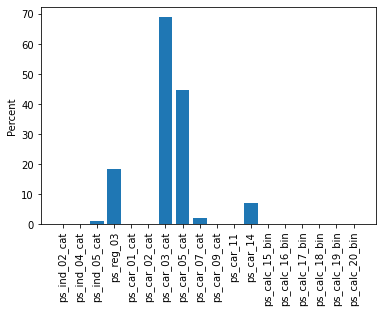

Missing values for Test dataset


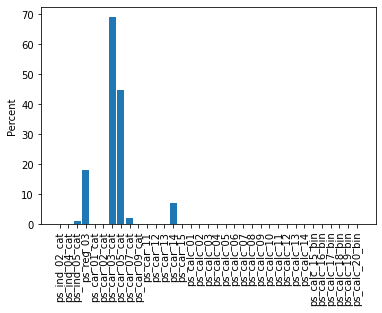

In [ ]:
print("Missing values for Train dataset")
describe_missing_values(train_df)

print("Missing values for Test dataset")
describe_missing_values(test_df)

In [ ]:
#Optional: There is a feature with 40+% missing values and another with 60+% missing values. We can get rid of these features.

In [ ]:
target = train_df.target
test_id = test_df.id
train_df.drop(["id", "target", "ps_car_03_cat", "ps_car_05_cat"], axis=1, inplace=True)
test_df.drop(["id", "ps_car_03_cat","ps_car_05_cat"], axis=1, inplace=True)

In [ ]:
#"cat" - categorical: fill missing values with mode value of particular column
#"bit" - binary: fill missing values with mode value of particular column
#all other - (continuous or ordinal): fill with mean value of particular column

In [ ]:
cat_cols = [col for col in train_df.columns if 'cat' in col]
bin_cols = [col for col in train_df.columns if 'bin' in col]
con_cols = [col for col in train_df.columns if col not in bin_cols + cat_cols]

for col in cat_cols:
    train_df[col].fillna(value=train_df[col].mode()[0], inplace=True)
    test_df[col].fillna(value=test_df[col].mode()[0], inplace=True)
    
for col in bin_cols:
    train_df[col].fillna(value=train_df[col].mode()[0], inplace=True)
    test_df[col].fillna(value=test_df[col].mode()[0], inplace=True)
    
for col in con_cols:
    train_df[col].fillna(value=train_df[col].mean(), inplace=True)
    test_df[col].fillna(value=test_df[col].mean(), inplace=True)

Missing values for Train dataset


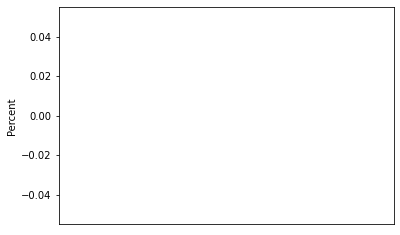

Missing values for Test dataset


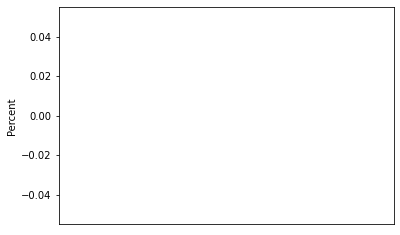

In [ ]:
print("Missing values for Train dataset")
describe_missing_values(train_df)

print("Missing values for Test dataset")
describe_missing_values(test_df)

**Part-4**

In [ ]:
import numpy as np
import pandas as pd 
import seaborn as sns

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Immo.csv to Immo (1).csv


In [ ]:
data_neuf = pd.read_csv('Immo.csv', sep=';')

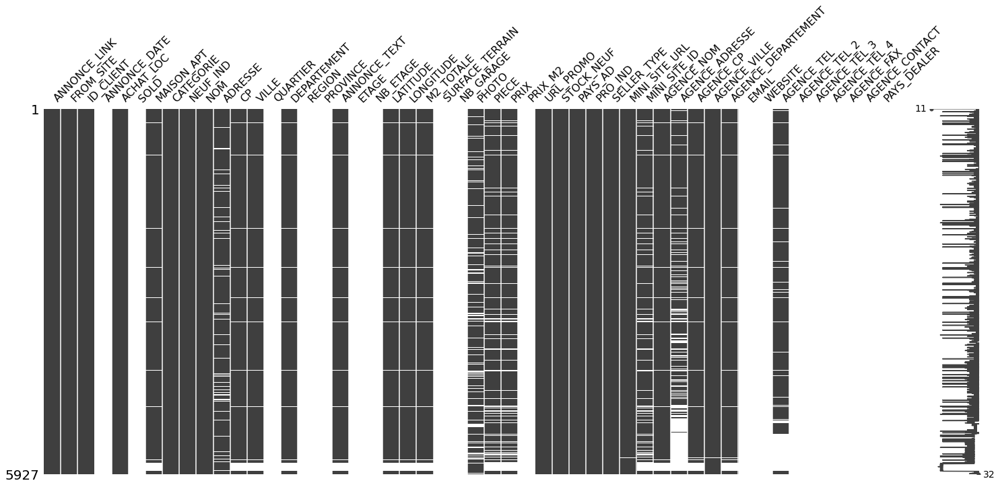

In [ ]:
#Checking for Missing values visually
#We can import the missingno library that can be used for graphical analysis of missing values and it is compatible with pandas.
#Using the matrix, we can quickly find the pattern of missingness in the dataset. The sparkline at right summarizes the general shape of the data completeness and points out the rows with the maximum and minimum nullity in the dataset.
import missingno as msno
msno.matrix(data_neuf)

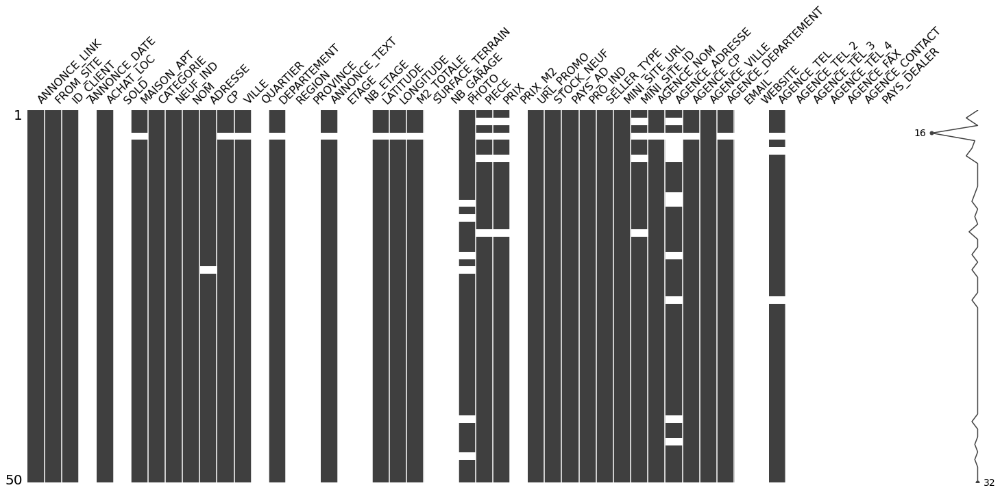

In [ ]:
msno.matrix(data_neuf.sample(50))

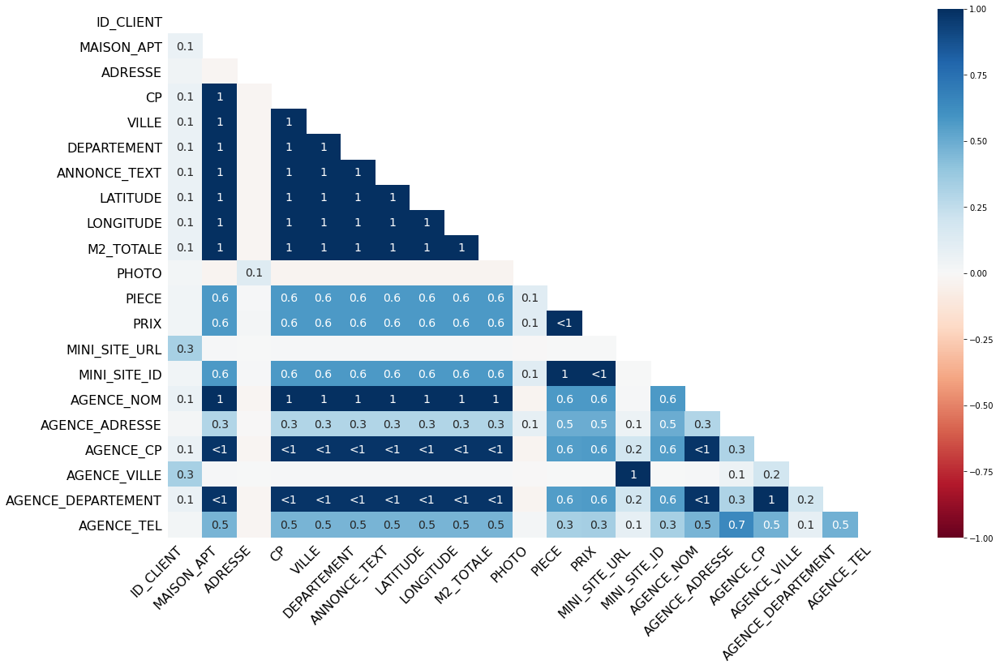

In [ ]:
#Heatmap
#The missingno correlation heatmap measures nullity correlation: how strongly the presence or absence of one variable affects the presence of another:
msno.heatmap(data_neuf)

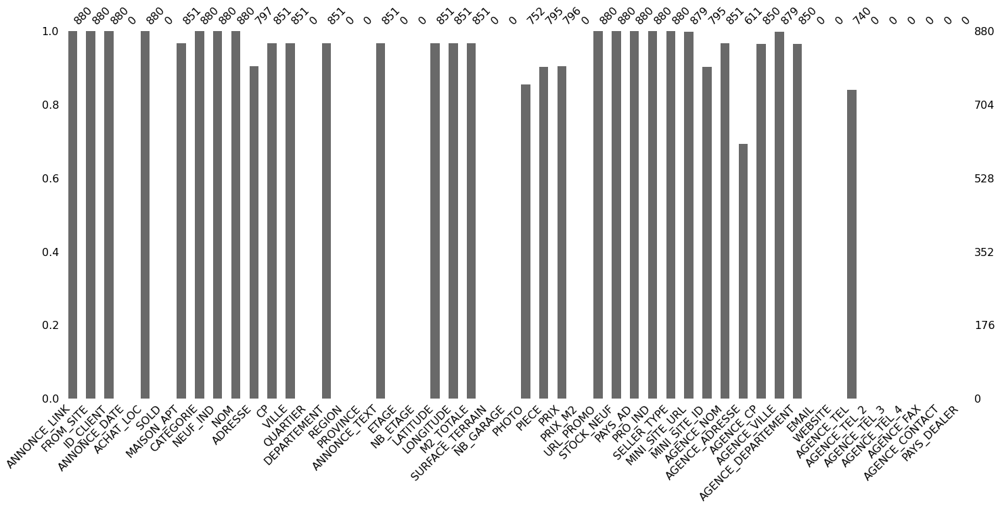

In [ ]:
#Bar Chart :
#This bar chart gives you an idea about how many missing values are there in each column.
msno.bar(data_neuf.sample(880))

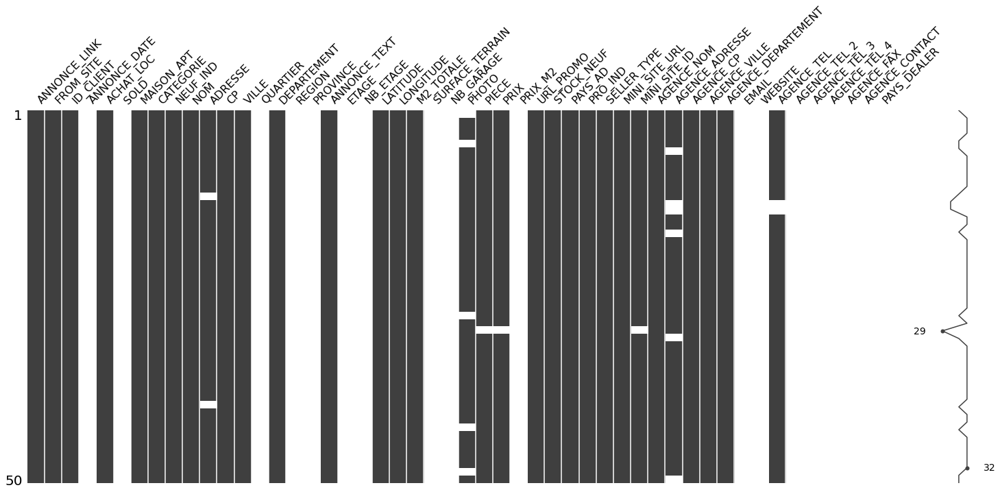

In [ ]:
msno.matrix(data_neuf.sample(50))

In [ ]:
#msno.bar(data, color = 'y', figsize = (10,8))

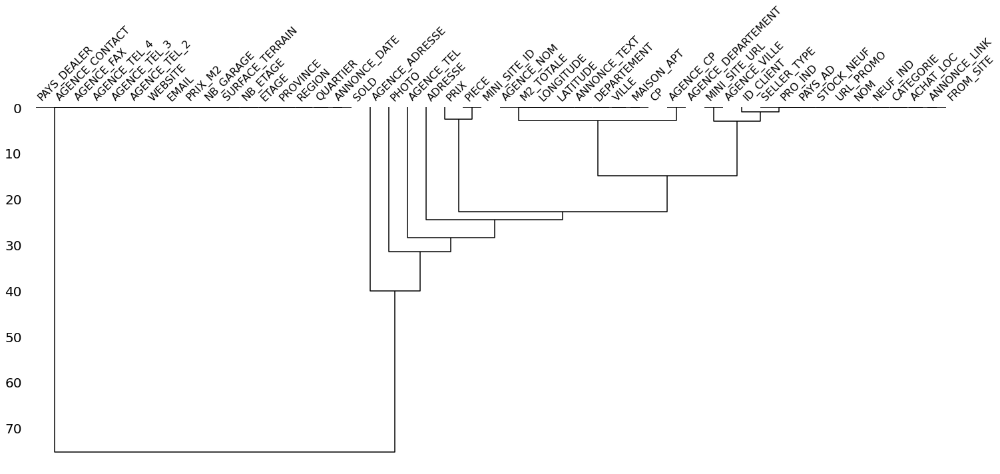

In [ ]:
#Dendogram
msno.dendrogram(data_neuf)

In [ ]:
#PandasProfiling
#Python package to help understand data quickly

In [ ]:
import pandas_profiling 

In [ ]:
data_neuf.profile_report()

In [ ]:
!pip install -U pandas-profiling

     |████████████████████████████████| 266kB 6.8MB/s 
     |████████████████████████████████| 3.1MB 18.4MB/s 
     |████████████████████████████████| 71kB 7.2MB/s 
     |████████████████████████████████| 604kB 39.7MB/s 
     |████████████████████████████████| 71kB 7.4MB/s 
     |████████████████████████████████| 296kB 36.0MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=7edbfce1b8f8b2f82ef470d41ccccc7612a0a701df195cfac1ecba354ba45ff8
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built htmlmin
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1
  Found existing installation: pandas-profiling 1.4.1
    Uninstalling pandas-profiling-1.4.1:
      Successfully uninstalled pandas-profiling-1.4.1


**Handling Missing Data Approach**

In [ ]:
According to me, there are two basic approach to handle missing data:

When missing data too large
When missing data is small
When missing data is too large, more then 80% or more than 90% (As per requirement) then it is advisable to drop entire columna nd not consider that particular column for further analysis. This is because the missing data is too large that predecting values can be tough and too risky. If values are predected wrong then it can also cause errors in our analysis.

When missing data is small we can do two things. First we can remove only those rows which have missing values, secondly we can try to impute or replace those missing values be certain analysis of already available values in our data set.

In [ ]:
# Import train.csv file in df_train dataframe
df_train = pd.read_csv("train.csv")

# Print all the columns available from file:
df_train.columns

In [ ]:
#Checking Null values in our data set
# How to calculate total missing values
total = df_train.isnull().sum().sort_values(ascending=False)

# Calculate percentage of missing values
percent = ((df_train.isnull().sum()/df_train.isnull().count())*100).sort_values(ascending=False)

# Presenting in tabular form by concatinating both values and create a seperate data set
missing_data = pd.concat([total,percent],axis=1,keys=['Total','Percent'])

# Now check top results of missing_data
missing_data.head(20)

In [ ]:
Ways to handle missing data in a data set
There can be multiple ways to handle missing data and this notebook I have mentioned below 5 best methods. Any method can be choosen depending upon the application. you can also think of any other method also depending upon the project requirement you have.

when missing data is small:

Deleting Rows
Replacing with Mean/Median/Mode values
Predicting the missing value
Using algorithm which support missing values
When missing data is too large:

Dropping the entire column
Our primary data set will remain df_train and dataframe having missing data will be missing_data. For simplicity I will be creating a seperate dataframe.

In [ ]:
#1. Deleting Rows
# Copying data frame
df_train_delrows = df_train
#Since we are taking action based on percentage of missing data, we are going to use missing_date to filter df_train_delrows data.

# All rows with less than 5% and greater than 0% of missing data
missing_data[(missing_data['Percent']<5) & (missing_data['Percent']>0)]

In [ ]:
# We can select rows by using below statement and then use it seperatly for each feature rows:
df_train_delrows[df_train_delrows['Electrical'].isnull()]

In [ ]:
# Deleting rows based on our above statement:
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['BsmtExposure'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['BsmtFinType2'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['BsmtFinType1'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['BsmtCond'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['BsmtQual'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['MasVnrArea'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['MasVnrType'].isnull()]).index,0)
df_train_delrows = df_train_delrows.drop((df_train_delrows[df_train_delrows['Electrical'].isnull()]).index,0)

In [ ]:
# Now verify if there is any missing data left for any of these columns
df_train_delrows['BsmtQual'].isnull().sum()
df_train_delrows['MasVnrArea'].isnull().sum()

In [ ]:
#2. Relacing with Mean/Median/Mode values
# Let's see missing_data dataset
missing_data.head(20)
# Loading a seperate dataset for mean
df_train_men = df_train
# Calculate Mean
df_train_men['MasVnrArea'].mean()
df_train_men[df_train_men['MasVnrArea'].isnull()]

In [ ]:
# now we can fill NaN records with Mean values
df_train_men['MasVnrArea'].fillna(df_train_men['MasVnrArea'].mean(), inplace=True)

In [ ]:
# Verify if NaN records still exists or not
df_train_men[df_train_men['MasVnrArea'].isnull()]

In [ ]:
# Dropping the entire Columns

# Percentage of missing values:
missing_data.head(20)

#Now consider we have decided to drop all those features for which values are missing more than 15%

# Dropping entire feature
df_train_null = df_train_null.drop((missing_data[missing_data['Percent']>15]).index,axis=1)
# Verify if columns exist or not
df_train_null.isnull().sum().sort_values(ascending=False).head(20)